In [1]:
set.seed(08226)
nresp <- 500

In [2]:
halo <- rnorm(n=nresp, mean=0, sd=5)
rides <- floor(halo + rnorm(n=nresp, mean=80, sd=3)+1)
games <- floor(halo + rnorm(n=nresp, mean=70, sd=7)+5)
wait <- floor(halo + rnorm(n=nresp, mean=65, sd=10)+9)
clean <- floor(halo + rnorm(n=nresp, mean=85, sd=2)+1)

In [3]:
distance <- rlnorm(n=nresp, meanlog=3, sdlog=1)
num.child <- sample(x=0:5, size=nresp, replace=TRUE, prob=c(0.3, 0.15, 0.25, 0.15, 0.1, 0.05))
weekend <- as.factor(sample(x=c("yes", "no"), size=nresp, replace=TRUE, prob=c(0.5,0.5)))

In [4]:
overall <- floor(halo + 0.5*rides + 0.1*games + 0.3*wait + 0.2*clean +
                 0.03*distance + 5*(num.child==0) + 0.3*wait*(num.child>0) +
                 rnorm(n=nresp, mean=0, sd=7) - 51)

In [5]:
sat.df <- data.frame(weekend, num.child, distance, rides, games, wait, clean, overall)
rm(nresp, weekend, distance, num.child, halo, rides, games, wait, clean, overall)

Loading required package: grid
Loading required package: lattice


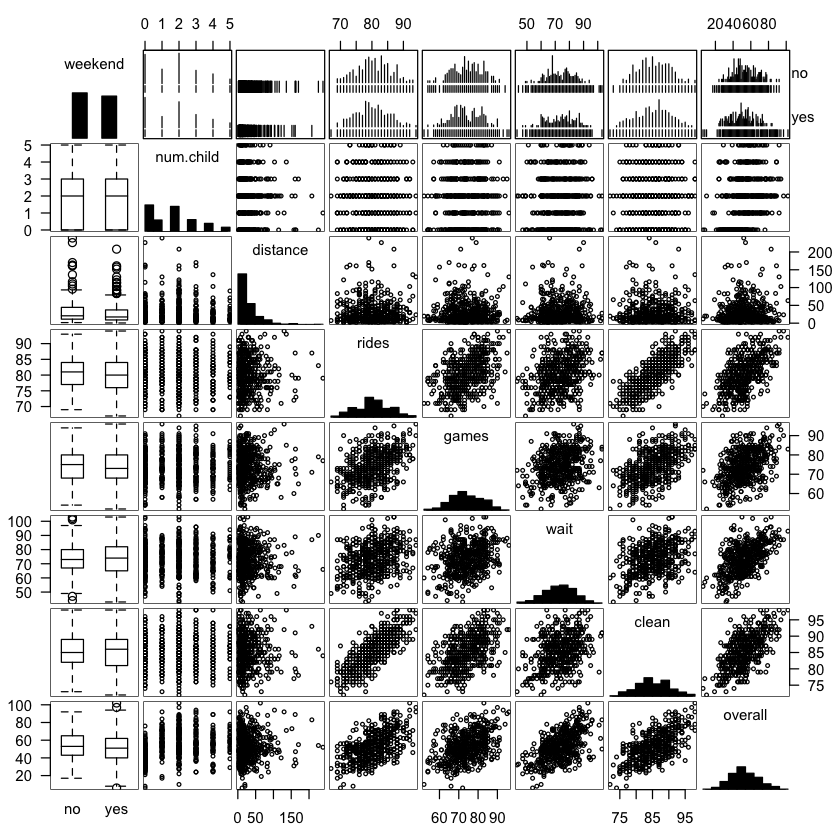

In [7]:
library(gpairs)
gpairs(sat.df)

In [8]:
sat.df$logdist <- log(sat.df$distance)


Attaching package: ‘gplots’

The following object is masked from ‘package:stats’:

    lowess



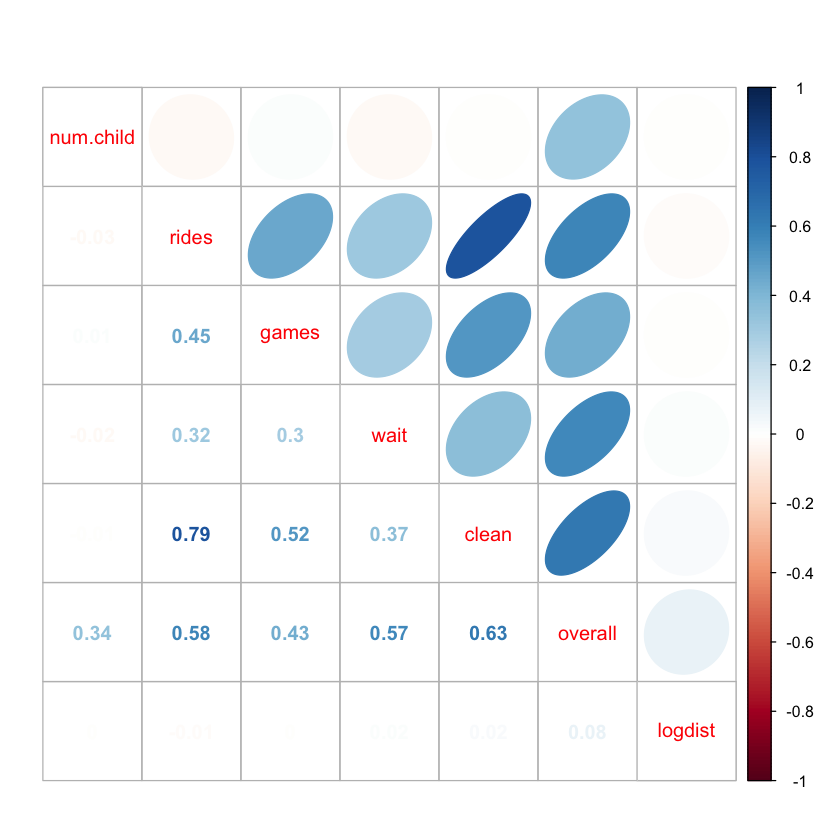

In [9]:
library(corrplot)
library(gplots)
corrplot.mixed(cor(sat.df[ , c(2, 4:9)]), upper="ellipse")

Inspection of the item associations is always recommended be- fore linear modeling, in order to check for extremely high correlations between items (such as r > 0.9). In the present data, rides and clean are highly re- lated (r = 0.79) but not so strongly that remediation is strictly required

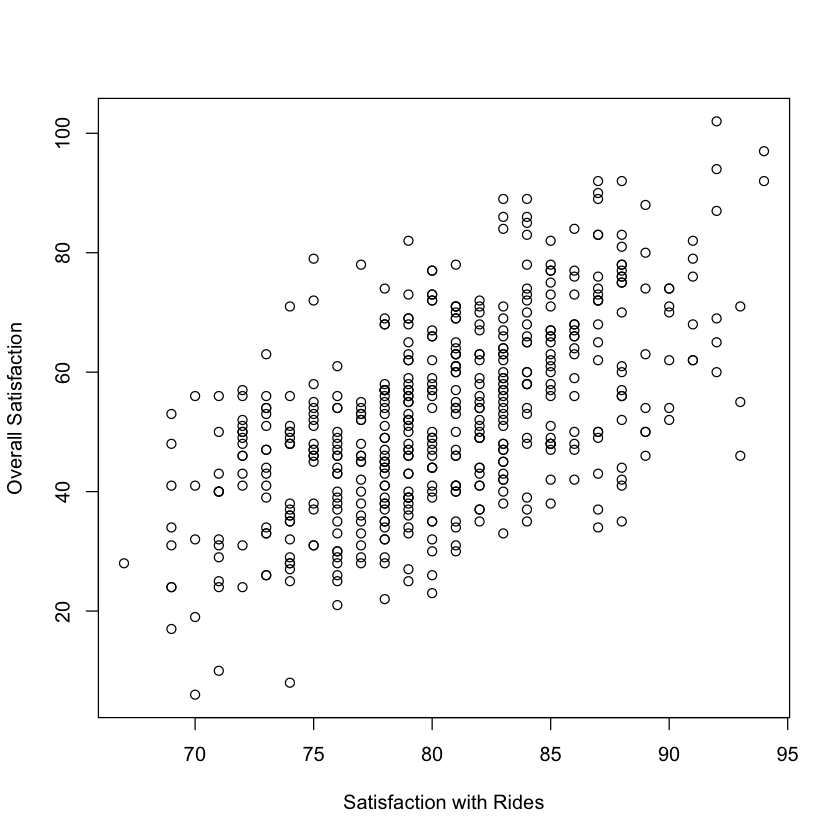

In [11]:
plot(overall~rides, data=sat.df, xlab="Satisfaction with Rides", ylab="Overall Satisfaction")

In [12]:
lm(overall ~ rides, data=sat.df)


Call:
lm(formula = overall ~ rides, data = sat.df)

Coefficients:
(Intercept)        rides  
    -85.013        1.715  


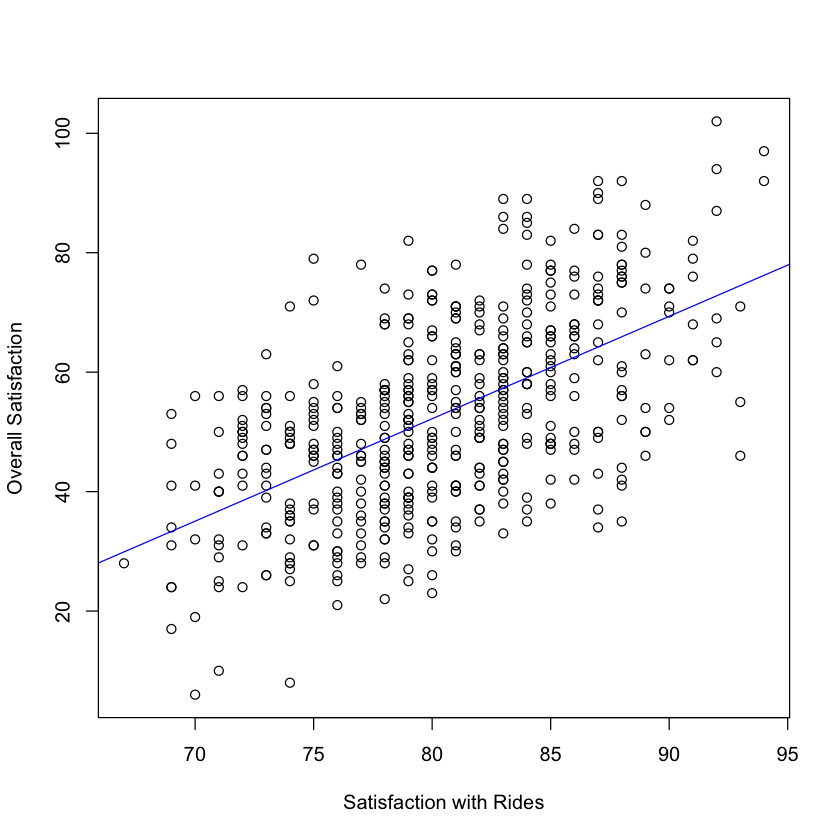

In [16]:
m1 <- lm(overall ~ rides, data=sat.df)
plot(overall ~ rides, data=sat.df,
     xlab="Satisfaction with Rides", ylab="Overall Satisfaction") 
abline(m1, col='blue')

In [17]:
str(m1)

List of 12
 $ coefficients : Named num [1:2] -85.01 1.72
  ..- attr(*, "names")= chr [1:2] "(Intercept)" "rides"
 $ residuals    : Named num [1:500] -6.63 11.37 12.51 -18.63 20.23 ...
  ..- attr(*, "names")= chr [1:500] "1" "2" "3" "4" ...
 $ effects      : Named num [1:500] -1181.9 -207.5 12.9 -18.5 20.7 ...
  ..- attr(*, "names")= chr [1:500] "(Intercept)" "rides" "" "" ...
 $ rank         : int 2
 $ fitted.values: Named num [1:500] 55.6 55.6 50.5 55.6 48.8 ...
  ..- attr(*, "names")= chr [1:500] "1" "2" "3" "4" ...
 $ assign       : int [1:2] 0 1
 $ qr           :List of 5
  ..$ qr   : num [1:500, 1:2] -22.3607 0.0447 0.0447 0.0447 0.0447 ...
  .. ..- attr(*, "dimnames")=List of 2
  .. .. ..$ : chr [1:500] "1" "2" "3" "4" ...
  .. .. ..$ : chr [1:2] "(Intercept)" "rides"
  .. ..- attr(*, "assign")= int [1:2] 0 1
  ..$ qraux: num [1:2] 1.04 1.01
  ..$ pivot: int [1:2] 1 2
  ..$ tol  : num 1e-07
  ..$ rank : int 2
  ..- attr(*, "class")= chr "qr"
 $ df.residual  : int 498
 $ xlevels  

In [18]:
summary(m1)


Call:
lm(formula = overall ~ rides, data = sat.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-33.910 -10.131   0.657   8.693  35.375 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -85.0132     8.7575  -9.707   <2e-16 ***
rides         1.7152     0.1087  15.779   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 13.15 on 498 degrees of freedom
Multiple R-squared:  0.3333,	Adjusted R-squared:  0.332 
F-statistic:   249 on 1 and 498 DF,  p-value: < 2.2e-16


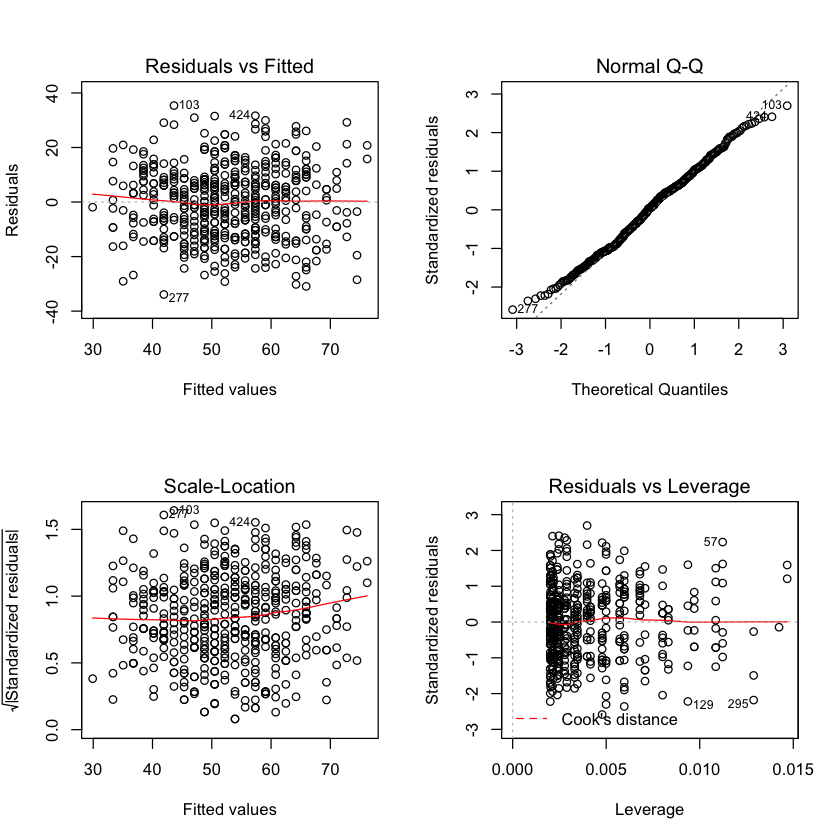

In [19]:
par(mfrow=c(2,2))
plot(m1)

The lower right plot in Fig. 7.5 plots the leverage of each point, a measure of how much influence the point has on the model coefficients. When a point has a high residual and high leverage, it indicates that the point has both a different pattern (residual) and undue influence (leverage). One measure of the leverage of a data point is Cook’s distance, an estimate of how much predicted (y) values would change if the model were re-estimated with that point eliminated from the data. If you have observations with high Cook’s distance, this chart would show dotted lines for the distances; in the present case, there are none.

In [20]:
sat.df[c(57, 129, 295),]

,weekend,num.child,distance,rides,games,wait,clean,overall,logdist
57,yes,2,63.29248,92,83,93,98,102,4.147767
129,yes,0,11.8955,70,72,54,74,6,2.476161
295,no,0,11.74474,93,78,67,89,46,2.463406


### Fitting Linear Models with Multiple Predictors

In [22]:
m2 <- lm(overall ~ rides + games + wait + clean, data=sat.df) 
summary(m2)


Call:
lm(formula = overall ~ rides + games + wait + clean, data = sat.df)

Residuals:
    Min      1Q  Median      3Q     Max 
-32.094  -7.054   0.938   7.552  29.026 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -125.16669    8.26913 -15.137  < 2e-16 ***
rides          0.53973    0.14761   3.656 0.000283 ***
games          0.16294    0.07119   2.289 0.022514 *  
wait           0.55688    0.04938  11.277  < 2e-16 ***
clean          0.95645    0.16402   5.831 9.94e-09 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 10.92 on 495 degrees of freedom
Multiple R-squared:  0.5428,	Adjusted R-squared:  0.5391 
F-statistic: 146.9 on 4 and 495 DF,  p-value: < 2.2e-16


Warning message:
: package ‘coefplot’ was built under R version 3.2.3Loading required package: ggplot2
Warning message:
: package ‘ggplot2’ was built under R version 3.2.3

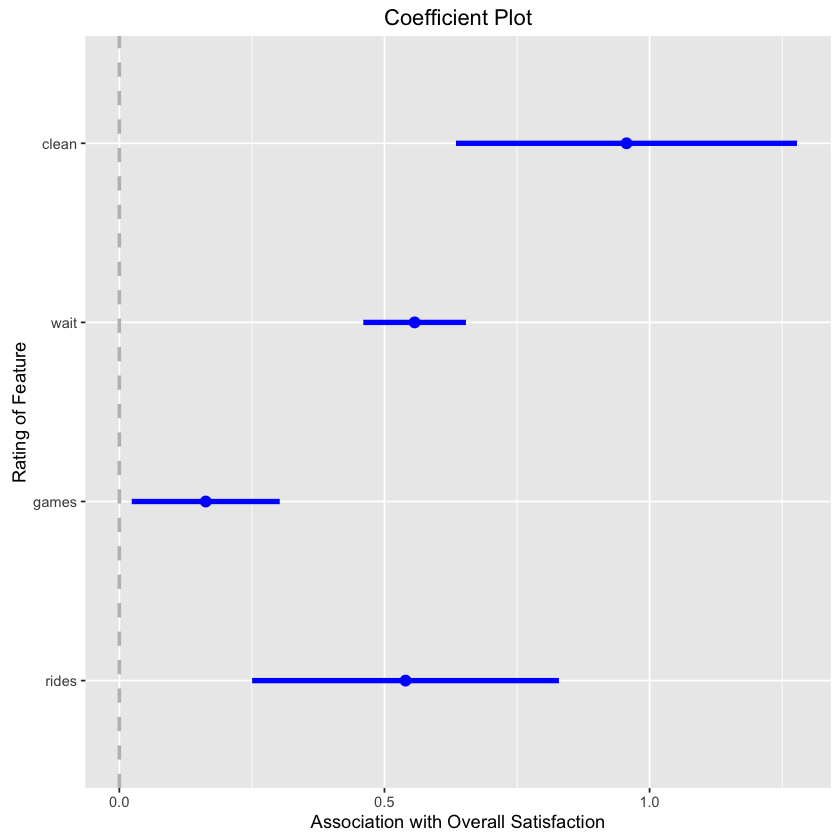

In [23]:
library(coefplot)   # install if necessary
coefplot(m2, intercept=FALSE, outerCI=1.96, lwdOuter=1.5,
         ylab="Rating of Feature",
         xlab="Association with Overall Satisfaction")

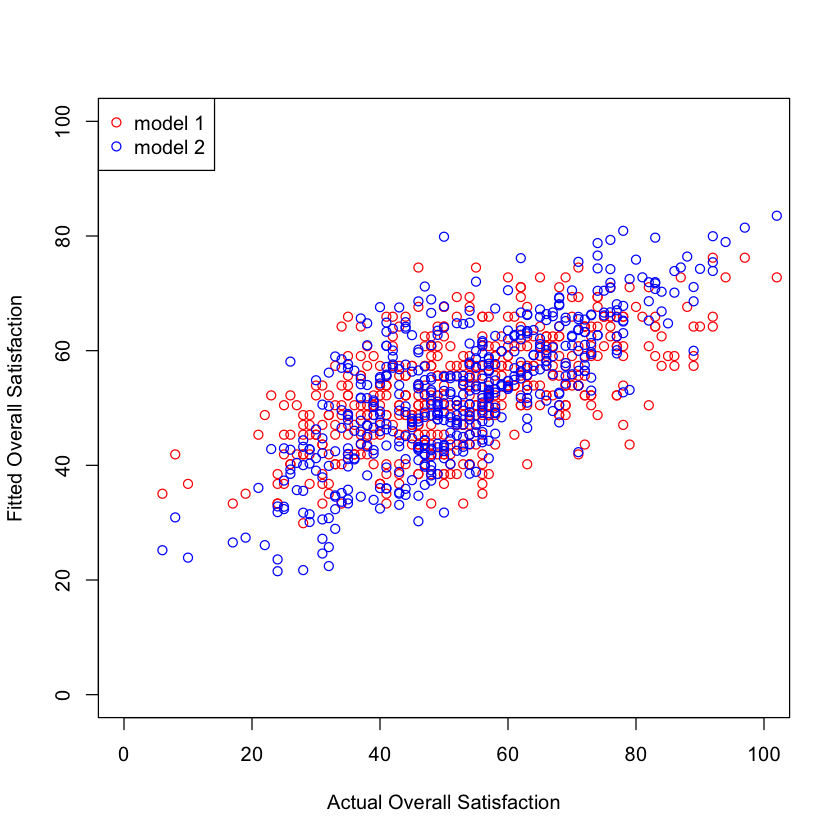

In [27]:
plot(sat.df$overall, fitted(m1), col='red', xlim=c(0,100), ylim=c(0,100),
     xlab="Actual Overall Satisfaction", ylab="Fitted Overall Satisfaction")
points(sat.df$overall, fitted(m2), col='blue')
legend("topleft", legend=c("model 1", "model 2"), col=c("red", "blue"), pch=1)

In [28]:
anova(m1, m2)

,Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
1,498,86102.74,NA,NA,NA,NA
2,495,59043.39,3,27059.35,75.61883,2.809585e-40


In [29]:
coef(m2)["(Intercept)"] + coef(m2)["rides"]*100 + coef(m2)["games"]*100 + coef(m2)["wait"]*100 + coef(m2)["clean"]*100
coef(m2)%*%c(1, 100, 100, 100, 100)

(Intercept) 
   96.43333

96.43333


In [30]:
predict(m2, sat.df[1:10,])
fitted(m2)[1:10]

1        2        3        4        5        6        7        8 
48.06609 55.87800 53.15632 51.80695 54.23474 30.12078 38.84865 44.70875 
       9       10 
67.35224 45.88656

1        2        3        4        5        6        7        8 
48.06609 55.87800 53.15632 51.80695 54.23474 30.12078 38.84865 44.70875 
       9       10 
67.35224 45.88656

When you wish to compare coefficients, it can be helpful to standardize data on a common scale before fitting a model (and after transforming any variables to a more normal scale). 

In [31]:
sat.std <- sat.df[ , -3]  # sat but remove distance
sat.std[ , 3:8] <- scale(sat.std[ , 3:8])
head(sat.std)

,weekend,num.child,rides,games,wait,clean,overall,logdist
1,yes,0,0.2987971,-0.7561865,-0.8757568,0.1184417,-0.2396868,1.788682
2,yes,2,0.2987971,-0.1408004,0.6123601,-0.2711692,0.879183,0.322636
3,no,1,-0.2552148,0.1053541,0.05431626,0.1184417,0.6305453,1.186276
4,yes,0,0.2987971,-0.7561865,-0.4107202,0.3132472,-0.9856,0.2803106
5,no,4,-0.4398855,1.089972,0.4263455,-0.2711692,1.003502,1.038503
6,no,5,-0.8092268,0.1053541,-2.084852,-1.634807,-1.482875,0.1452467


In [33]:
m3 <- lm(overall ~ rides + games + wait + clean + weekend + logdist + num.child, data = sat.std)
summary(m3)


Call:
lm(formula = overall ~ rides + games + wait + clean + weekend + 
    logdist + num.child, data = sat.std)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.59719 -0.40353  0.02127  0.41037  1.69667 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.39256    0.04673  -8.400 4.82e-16 ***
rides        0.20617    0.04209   4.899 1.31e-06 ***
games        0.07229    0.03040   2.378   0.0178 *  
wait         0.37979    0.02791  13.609  < 2e-16 ***
clean        0.28902    0.04429   6.525 1.69e-10 ***
weekendyes  -0.04800    0.05165  -0.929   0.3531    
logdist      0.06420    0.02584   2.484   0.0133 *  
num.child    0.23918    0.01719  13.914  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5737 on 492 degrees of freedom
Multiple R-squared:  0.6754,	Adjusted R-squared:  0.6708 
F-statistic: 146.3 on 7 and 492 DF,  p-value: < 2.2e-16


In [34]:
sat.std$num.child.factor <- factor(sat.std$num.child)
m4 <- lm(overall ~ rides + games + wait + clean 
         + weekend + logdist + num.child.factor, data=sat.std) 
summary(m4)


Call:
lm(formula = overall ~ rides + games + wait + clean + weekend + 
    logdist + num.child.factor, data = sat.std)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.24789 -0.32694 -0.00731  0.31878  1.50670 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)       -0.72558    0.04429 -16.383  < 2e-16 ***
rides              0.22159    0.03489   6.351 4.91e-10 ***
games              0.04378    0.02517   1.740   0.0826 .  
wait               0.38332    0.02308  16.607  < 2e-16 ***
clean              0.29639    0.03668   8.080 5.11e-15 ***
weekendyes        -0.02307    0.04265  -0.541   0.5888    
logdist            0.03002    0.02144   1.400   0.1621    
num.child.factor1  1.06476    0.07036  15.134  < 2e-16 ***
num.child.factor2  1.08735    0.05565  19.540  < 2e-16 ***
num.child.factor3  1.02900    0.06933  14.841  < 2e-16 ***
num.child.factor4  0.98543    0.07928  12.429  < 2e-16 ***
num.child.factor5  1.05185    0.10234  10.278  < 2e-1

A striking thing about m4 is that the increase in overall satisfaction is about the same regardless of how many children there are in the party—about one standard deviation higher for any number of children. This suggests that we don’t actually need to estimate a different increase for each number of children. In fact, if the increase is the same for one child as for five children, attempting to fit a model that scales increasingly per child would result in a less accurate estimate.

In [35]:
sat.std$has.child <- factor(sat.std$num.child > 0)
m5 <- lm(overall ~ rides + games + wait + clean + logdist + has.child, data=sat.std)
summary(m5)


Call:
lm(formula = overall ~ rides + games + wait + clean + logdist + 
    has.child, data = sat.std)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.25789 -0.33632 -0.00457  0.33153  1.44988 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)   -0.73693    0.03856 -19.113  < 2e-16 ***
rides          0.22074    0.03461   6.378 4.14e-10 ***
games          0.04517    0.02506   1.803    0.072 .  
wait           0.38441    0.02296  16.745  < 2e-16 ***
clean          0.29650    0.03643   8.139 3.27e-15 ***
logdist        0.03323    0.02120   1.567    0.118    
has.childTRUE  1.05577    0.04622  22.841  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.472 on 493 degrees of freedom
Multiple R-squared:  0.7799,	Adjusted R-squared:  0.7772 
F-statistic: 291.1 on 6 and 493 DF,  p-value: < 2.2e-16


### Interaction Terms

In [36]:
m6 <- lm(overall ~ rides + games + wait + clean + weekend + logdist + has.child +
         rides:has.child + games:has.child + wait:has.child + 
         clean:has.child + rides:weekend + games:weekend +
         wait:weekend + clean:weekend, data=sat.std)
summary(m6)


Call:
lm(formula = overall ~ rides + games + wait + clean + weekend + 
    logdist + has.child + rides:has.child + games:has.child + 
    wait:has.child + clean:has.child + rides:weekend + games:weekend + 
    wait:weekend + clean:weekend, data = sat.std)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.20261 -0.30320  0.00773  0.29361  1.45689 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)         -0.713325   0.042449 -16.804  < 2e-16 ***
rides                0.148643   0.067163   2.213 0.027351 *  
games                0.078536   0.048690   1.613 0.107400    
wait                 0.132495   0.043805   3.025 0.002621 ** 
clean                0.295242   0.078623   3.755 0.000194 ***
weekendyes          -0.020619   0.040716  -0.506 0.612804    
logdist              0.024894   0.020425   1.219 0.223508    
has.childTRUE        1.046062   0.044278  23.625  < 2e-16 ***
rides:has.childTRUE  0.055652   0.072014   0.773 0.440021    
game

In [37]:
m7 <- lm(overall ~ rides + games + wait + clean + logdist + has.child + 
         wait:has.child, data=sat.std)
summary(m7)


Call:
lm(formula = overall ~ rides + games + wait + clean + logdist + 
    has.child + wait:has.child, data = sat.std)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.18307 -0.30375 -0.00022  0.32294  1.41932 

Coefficients:
                   Estimate Std. Error t value Pr(>|t|)    
(Intercept)        -0.72869    0.03639 -20.023  < 2e-16 ***
rides               0.21428    0.03267   6.560 1.37e-10 ***
games               0.04970    0.02365   2.102   0.0361 *  
wait                0.15195    0.03666   4.145 3.99e-05 ***
clean               0.28797    0.03439   8.374 5.84e-16 ***
logdist             0.02767    0.02002   1.382   0.1676    
has.childTRUE       1.04898    0.04362  24.047  < 2e-16 ***
wait:has.childTRUE  0.34105    0.04339   7.861 2.43e-14 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.4453 on 492 degrees of freedom
Multiple R-squared:  0.8045,	Adjusted R-squared:  0.8017 
F-statistic: 289.1 on 7 and 492 DF,  

What do we do with these results as marketers? We identify several possible mar- keting interventions. If we want to increase satisfaction overall, we could perhaps do so by trying to increase the number of visitors with children. Alternatively, if we want to appeal to visitors without children, we might engage in further research to understand why their ratings are lower. If we are allocating budget to personnel, the importance of cleanliness suggests continuing to allocate resources there (as opposed, say, to games). We might also want to learn more about the association be- tween children and waiting time, and whether there are things we could do to make waiting less frequent or more enjoyable.

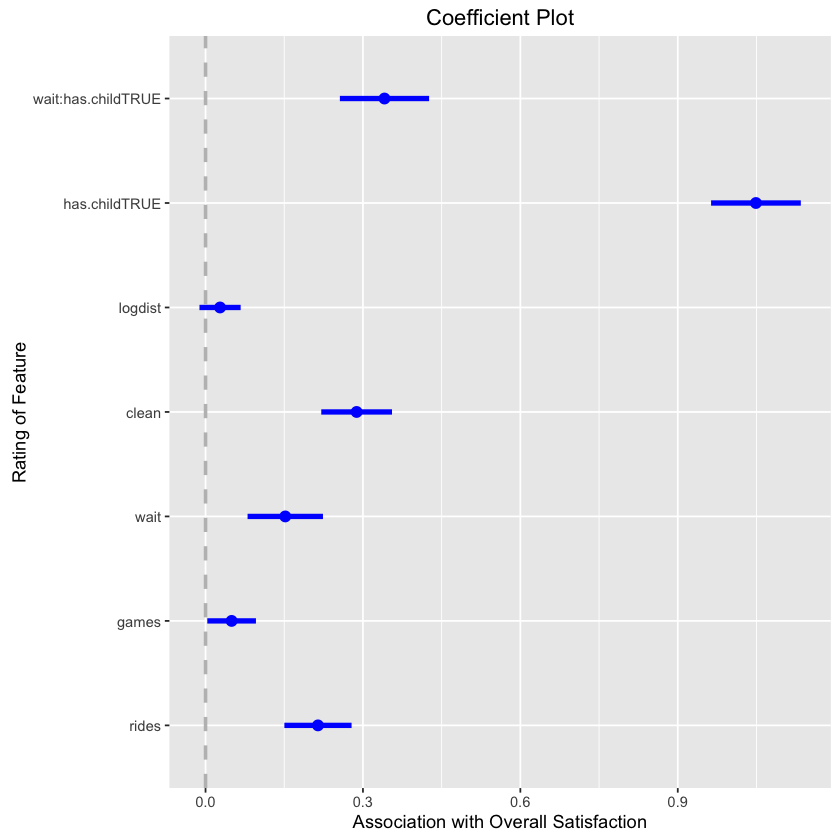

In [38]:
coefplot(m7, intercept=FALSE, outerCI=1.96, lwdOuter=1.5,
         ylab="Rating of Feature",
         xlab="Association with Overall Satisfaction")

We followed a lengthy process to arrive at the final model m7, and it is helpful to recount the general steps we recommend in creating such a linear model.
1. Inspect the data to make sure it is clean and has the structure you expect, fol- lowing the outline in Sect. 3.3.3.
2. Checkthedistributionsofthevariablestomakesuretheyarenothighlyskewed (Sect. 7.2.1). If one is skewed, consider transforming it (Sect. 4.5.4).
3. Examine the bivariate scatterplots and correlation matrix (Sect. 7.2.1) to see whether there are any extremely correlated variables (such as r > 0.9, or sev- eral with r > 0.8). If so, omit some variables or consider transforming them if needed; see Sect. 9.1 for further discussion.
4. If you wish to estimate coefficients on a consistent scale, standardize the data with scale() (Sect. 7.3.3).
5. After fitting a model, check the residual quantiles in the output. The residuals show how well the model accounts for the individual observations (Sect. 7.2.4).
6. Check the standard model plots using plot(), which will help you judge whether a linear model is appropriate or whether there is nonlinearity, and will identify potential outliers in the data (Sect. 7.2.4).
7. Try several models and compare them for overall interpretability and model fit by inspecting the residuals’ spread and overall R2 (Sect. 7.3.1). If the models are nested, you could also use anova() for comparison (Sect. 6.5.1) .
8. Report the confidence intervals of the estimates with your interpretation and recommendations (Sect. 7.3).

### Bayesian Linear Models with MCMCregress()

In [39]:
library(MCMCpack)
m7.bayes <- MCMCregress(overall ~ rides + games + wait + clean + logdist +
                        has.child + wait:has.child, data=sat.std)
summary(m7.bayes)

Loading required package: coda
Loading required package: MASS
Warning message:
: package ‘MASS’ was built under R version 3.2.2##
## Markov Chain Monte Carlo Package (MCMCpack)
## Copyright (C) 2003-2016 Andrew D. Martin, Kevin M. Quinn, and Jong Hee Park
##
## Support provided by the U.S. National Science Foundation
## (Grants SES-0350646 and SES-0350613)
##



Iterations = 1001:11000
Thinning interval = 1 
Number of chains = 1 
Sample size per chain = 10000 

1. Empirical mean and standard deviation for each variable,
   plus standard error of the mean:

                       Mean      SD  Naive SE Time-series SE
(Intercept)        -0.72884 0.03657 0.0003657      0.0003657
rides               0.21426 0.03304 0.0003304      0.0003256
games               0.04985 0.02371 0.0002371      0.0002371
wait                0.15196 0.03661 0.0003661      0.0003661
clean               0.28759 0.03468 0.0003468      0.0003468
logdist             0.02739 0.02005 0.0002005      0.0002005
has.childTRUE       1.04906 0.04386 0.0004386      0.0004386
wait:has.childTRUE  0.34149 0.04317 0.0004317      0.0004317
sigma2              0.19884 0.01274 0.0001274      0.0001274

2. Quantiles for each variable:

                        2.5%      25%      50%      75%   97.5%
(Intercept)        -0.798838 -0.75363 -0.72898 -0.70444 -0.6565
rides               0.148305 

The same modeling approach could be applied to many other marketing applications, such as advertising response (or marketing mix) modeling [18], customer retention (or churn) modeling, and pricing analysis.

Other models apply in cases where the variables are different in structure, such as binary outcomes or counts. However, the process of estimating those is similar to the steps here. Such models include pois- son and binomial regression model for outcomes that are counts, hazard regression for event occurrence (also known as timing regression or survival modeling), and logistic regression for binary outcomes.

Many survey studies collect ratings on a 5- or 7-point scale, which may be questionable to fit with a linear model. Although many analysts use lm() for outcomes on 5- or 7-point scales, an alternative is a cut-point model, such as an ordered logit or probit model. Such a model will fit the data better and won’t make nonsensical predictions like a rating of 6.32 on a 5-point scale (as lm() might). These models can be fit with the polr() function from the MASS package [157].

A more sophisticated model for ordinal ratings data is a Bayesian scale-usage het- erogeneity model, as described by Rossi, Allenby, and McCullough [137]. This models that different customers (and cultures) may use scales in different ways; some customers may give systematically higher or lower scores than others due to differences in interpreting the rating scale. 